In [1]:
import igraph
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import math
import matplotlib.patches as mpatches
import matplotlib.pyplot as plt
import os
os.chdir("../src")
from build_network_object import build_network_object
from draw_network_by_classification import draw_network_by_classification, compare_degrees_strength
from draw_adjacency_matrix import draw_adjacency_matrix
from draw_and_print_communities import draw_and_print_communities, compare_comunity_intersection
from correlations import correlation_industry_pairs, correlation_network_degree,correlation_adjacency_matrix
import seaborn as sns

# Flows algorithm to create an adjacency matrix of industry pairs

## Data
* Join 5 years of ASHE sample, in this case 
    * from 2009 to 2013 
    * from 2014 to 2018. 
   
This can change in the future depending which matrix we want to build (2 years, 5 years, 10 years, etc).

## Selection:
* Select individuals with no missing data in age, sic07, personal id or work postcode variables. 
* Select individuals with age > 15 & age < 65.

* Loop over each unique individual in the dataset (unique "piden"):
     - Select all inputs observed for that individual into a table. e.g, for individual with "piden"==1 :
        
| piden | year | sic07 |work postcode |
|-------|------|-------|--------------|
| 1     | 2009 | A     | A1           |
| 1     | 2010 | A     | A1           |
| 1     | 2010 | B     | B1           |
| 1     | 2011 | C     | C1           |
| 1     | 2013 | D     | D1           |
| 1     | 2013 | D     | D2           |


## Algorithm:


   * **Build "flows"**: Sort table by year, and define a flow as 2 consecutive entries. Create a table as the following:

| piden | flow | years    | postcodes |
|-------|------|----------|--------|
| 1     | A-A  |2009-2010 | A1-A1   | 
| 1     | A-B  |2010-2010 | A1-B1   | 
| 1     | B-C  |2010-2011 | B1-C1   | 
| 1     | C-D  |2011-2013 | C1-D1   | 
| 1     | D-D  |2013-2013 | D1-D2   | 

## Select valid flows/connections:

The flow/connection selection is agnostic to the approach used before.

   * Define a time threshold, valid flows/connections can not be separated by more than X years (eg. in this case 2 years).
   * A flow/connection can not happen within the same job in 2 different years (if the flow/connection industry code and the work postcode are the same is not considered).
   * Only consider unique flows/connection (especially for the connection table).

       eg. resulting flow table:

| piden | flow | years    | postcodes |
|-------|------|----------|-----------|
| 1     | A-B  |2010-2010 | A1-B1     | 
| 1     | B-C  |2010-2011 | B1-C1     | 
| 1     | C-D  |2011-2013 | C1-D1     | 
| 1     | D-D  |2013-2013 | D1-D2     |

## Adjacency matrix

Project the flows/connection pairs to an adjacency matrix. Each pair is 1 count.

* Flows are considered directed: 

|-|A|B|C|D|
|-|-|-|-|-|
|A|0|1|0|0|
|B|0|0|1|0|
|C|0|0|0|1|
|D|0|0|0|1|

## Normalisation process:

* Given that flows with less than 10 events can not be exported, if A[i,j] is observed, then A[j,i] is assumed to be 10 (this is to reduce the latter effect of symetrisation on the strength of the flow). 
* The adjacency matrix is normalised following the procedure described by [Neffke](http://doku.iab.de/fdz/reporte/2017/MR_04-17_EN.pdf)


# Comparison between 2009-2013 and 2014-2018 matrices 
## 2009 - 2013:

In [2]:
label1 = "Table1_Reduced_matrix_2009_2013_flows"

reduced_matrix_2009_2013 = pd.read_csv("../data/"+label1+".csv", index_col=0)
reduced_matrix_2009_2013 = reduced_matrix_2009_2013[reduced_matrix_2009_2013['StartIndst']!=0]


sub_matrix_2009_2013_less1 = reduced_matrix_2009_2013[reduced_matrix_2009_2013['weight']<1].sort_values(by=['weight'], ascending=False)
sub_matrix_2009_2013 = sub_matrix_2009_2013_less1[sub_matrix_2009_2013_less1['weight']>0].sort_values(by=['weight'], ascending=False)

print ("Number of links:", sub_matrix_2009_2013.shape[0]/2)

print ("Number of 4-digit industries observed:")
print (len(np.unique([sub_matrix_2009_2013['StartIndst'].values,sub_matrix_2009_2013['FinalIndst'].values])))

sub_matrix_2009_2013[1:15]

Number of links: 595.0
Number of 4-digit industries observed:
286


,StartIndst,FinalIndst,weight,SubActivity_StartIndst,SubActivity_FinalIndst,MainActivity_StartIndst,MainActivity_FinalIndst,MainIndustry_StartIndst,MainIndustry_FinalIndst,Counts
2031,2732,2731,0.999837,"Other electronic, electric wires",Fibre optic cables,Electrical equipment,Electrical equipment,"Manufacture computer, electronic, light electr...","Manufacture computer, electronic, light electr...",10.0
2056,2731,2732,0.999821,Fibre optic cables,"Other electronic, electric wires",Electrical equipment,Electrical equipment,"Manufacture computer, electronic, light electr...","Manufacture computer, electronic, light electr...",11.0
2053,1712,1813,0.999707,"Paper, paperboard","Pre-press, pre-media services",Paper and paper products,Printing,All other Manufacturing,All other Manufacturing,18.0
1952,2812,2814,0.999675,Fluid power equipment,"Other taps, valves",General machinery,General machinery,"Manufacture machinery, vehicle, transport","Manufacture machinery, vehicle, transport",10.0
1970,2620,2899,0.999610,"Computers, peripheral equipment",Other,"Computer, electronic, optical",Special purpose machinery,"Manufacture computer, electronic, light electr...","Manufacture machinery, vehicle, transport",12.0
1837,3040,3311,0.999594,Military fighting vehicles,Fabricated metal products,Other transport equipment,Repair/installation excl. household,"Manufacture machinery, vehicle, transport",Machinery repair excluding motor vehicles,10.0
2035,2814,2812,0.999577,"Other taps, valves",Fluid power equipment,General machinery,General machinery,"Manufacture machinery, vehicle, transport","Manufacture machinery, vehicle, transport",16.0
2023,2899,2620,0.999561,Other,"Computers, peripheral equipment",Special purpose machinery,"Computer, electronic, optical","Manufacture machinery, vehicle, transport","Manufacture computer, electronic, light electr...",15.0
1929,2362,812,0.999545,Plaster products for construction,"Gravel, sand pits; clays, kaolin","Concrete, cement and plaster","Mining, Quarrying and other",All other Manufacturing,"Mining, Quarrying (inc extraction of petroleum...",15.0
2042,1722,1729,0.999512,"Household, sanitary, toilet goods",Other,Paper and paper products,Paper and paper products,All other Manufacturing,All other Manufacturing,10.0


## 2014 - 2018:


In [3]:
label2 = "Table3_Reduced_matrix_2014_2018_flows"
reduced_matrix_2014_2018 = pd.read_csv("../data/"+label2+".csv", index_col=0)
reduced_matrix_2014_2018 = reduced_matrix_2014_2018[reduced_matrix_2014_2018['StartIndst']!=0]

sub_matrix_2014_2018_less1 = reduced_matrix_2014_2018[reduced_matrix_2014_2018['weight']<1].sort_values(by=['weight'], ascending=False)
sub_matrix_2014_2018 = sub_matrix_2014_2018_less1[sub_matrix_2014_2018_less1['weight']>0].sort_values(by=['weight'], ascending=False)

print ("Number of links:", sub_matrix_2014_2018.shape[0]/2)
print ("Number of 4-digit industries observed:")
print (len(np.unique([sub_matrix_2014_2018['StartIndst'].values,sub_matrix_2014_2018['FinalIndst'].values])))
sub_matrix_2014_2018[1:15]


Number of links: 555.0
Number of 4-digit industries observed:
220


,StartIndst,FinalIndst,weight,SubActivity_StartIndst,SubActivity_FinalIndst,MainActivity_StartIndst,MainActivity_FinalIndst,MainIndustry_StartIndst,MainIndustry_FinalIndst,Counts
1976,2399,2363,0.999586,Non-metallic mineral nec,Ready-mixed concrete,Other non-metallic mineral products,"Concrete, cement and plaster",All other Manufacturing,All other Manufacturing,10.0
2030,4636,1082,0.999552,"Sugar, chocolate","Cocoa, choc, sugar confectionery","Food, beverages, tobacco wholesale",Food products - other,"Wholesale and retail,motor vehicle repair,sale...","Manufacture food, drink, tobacco",10.0
2166,3317,4212,0.999500,Transport equipment nec,"Railways, underground railways",Repair/installation excl. household,Civil engineering,Machinery repair excluding motor vehicles,Construction (including development of real es...,16.0
2149,147,1091,0.999500,Raising of poultry,Prepared farm animals feeds,"Animal production, hunting",Food products - other,"Agriculture, Forestry, Fishing, Veterinary","Manufacture food, drink, tobacco",10.0
2083,1091,147,0.999483,Prepared farm animals feeds,Raising of poultry,Food products - other,"Animal production, hunting","Manufacture food, drink, tobacco","Agriculture, Forestry, Fishing, Veterinary",11.0
2167,1089,1084,0.999449,Other food products nec,Condiments and seasonings,Food products - other,Food products - other,"Manufacture food, drink, tobacco","Manufacture food, drink, tobacco",11.0
2145,1084,1089,0.999294,Condiments and seasonings,Other food products nec,Food products - other,Food products - other,"Manufacture food, drink, tobacco","Manufacture food, drink, tobacco",10.0
2162,1082,4636,0.999294,"Cocoa, choc, sugar confectionery","Sugar, chocolate",Food products - other,"Food, beverages, tobacco wholesale","Manufacture food, drink, tobacco","Wholesale and retail,motor vehicle repair,sale...",25.0
2025,811,2351,0.999225,"Ornamental, building stone etc",Cement,"Mining, Quarrying and other",Other non-metallic mineral products,"Mining, Quarrying (inc extraction of petroleum...",All other Manufacturing,10.0
2161,2363,2399,0.999173,Ready-mixed concrete,Non-metallic mineral nec,"Concrete, cement and plaster",Other non-metallic mineral products,All other Manufacturing,All other Manufacturing,34.0


/anaconda3/envs/kflows/lib/python3.7/site-packages/seaborn/axisgrid.py:1847: UserWarning: JointGrid annotation is deprecated and will be removed in a future release.
  warnings.warn(UserWarning(msg))


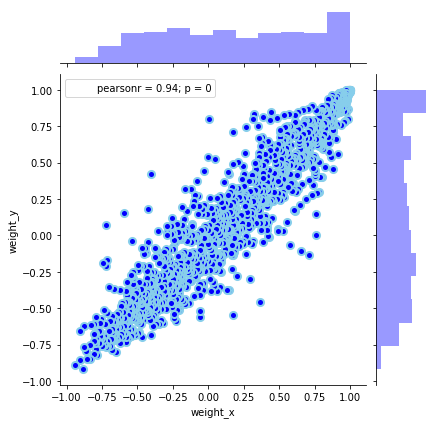

/anaconda3/envs/kflows/lib/python3.7/site-packages/seaborn/axisgrid.py:1847: UserWarning: JointGrid annotation is deprecated and will be removed in a future release.
  warnings.warn(UserWarning(msg))


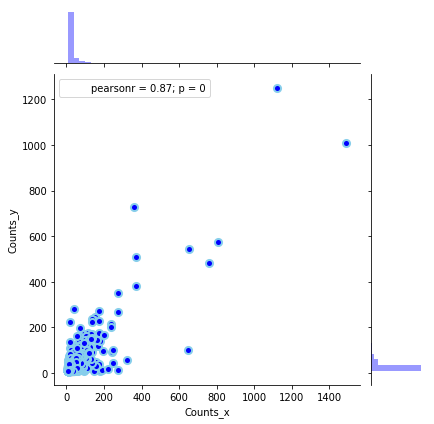

In [4]:
correlation_industry_pairs(sub_matrix_2009_2013_less1,sub_matrix_2014_2018_less1)


correlation_industry_pairs(sub_matrix_2009_2013_less1,sub_matrix_2014_2018_less1,'counts')


/Users/crangelsmith/PycharmProjects/KnowledgeFlows/python/labour_flows_matrix/src/correlations.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  df_industry1['id'] = df_industry1.groupby(['StartIndst', 'FinalIndst']).ngroup()
/anaconda3/envs/kflows/lib/python3.7/site-packages/seaborn/axisgrid.py:1847: UserWarning: JointGrid annotation is deprecated and will be removed in a future release.
  warnings.warn(UserWarning(msg))


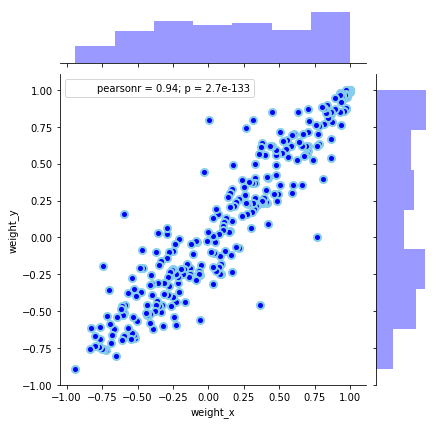

/anaconda3/envs/kflows/lib/python3.7/site-packages/seaborn/axisgrid.py:1847: UserWarning: JointGrid annotation is deprecated and will be removed in a future release.
  warnings.warn(UserWarning(msg))


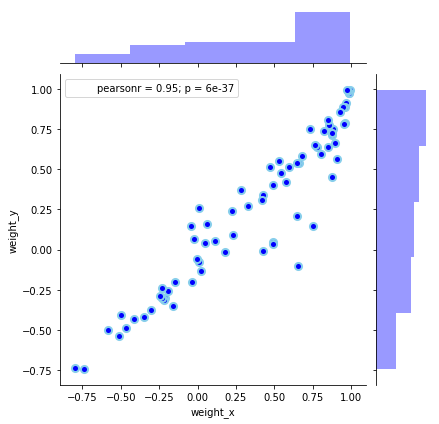

In [5]:
correlation_industry_pairs(sub_matrix_2009_2013_less1[sub_matrix_2009_2013_less1['Counts']<11],sub_matrix_2014_2018_less1,'weight')


correlation_industry_pairs(sub_matrix_2009_2013_less1[sub_matrix_2009_2013_less1['Counts']>100],sub_matrix_2014_2018_less1,'weight')


In [6]:
Gm_simple_2009_2013 = build_network_object(reduced_matrix_2009_2013,'weight')
Gm_simple_2014_2018 = build_network_object(reduced_matrix_2014_2018,'weight')

## Degree comparison:

NETWORK OF 2009-2013


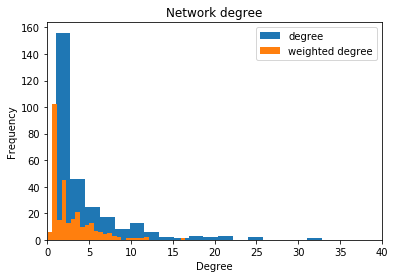

mean degree 4.356643356643357
mean strenght 2.798425538293991


NETWORK OF 2014-2018


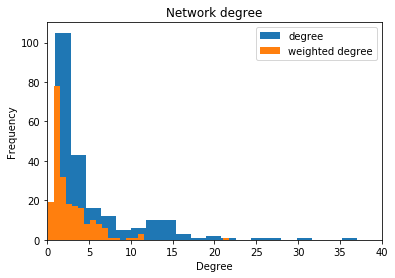

mean degree 5.390909090909091
mean strenght 2.7114018585506816


In [7]:
print ('NETWORK OF 2009-2013')
compare_degrees_strength(Gm_simple_2009_2013)
print()
print()
print ('NETWORK OF 2014-2018')
compare_degrees_strength(Gm_simple_2014_2018)

/anaconda3/envs/kflows/lib/python3.7/site-packages/seaborn/axisgrid.py:1847: UserWarning: JointGrid annotation is deprecated and will be removed in a future release.
  warnings.warn(UserWarning(msg))


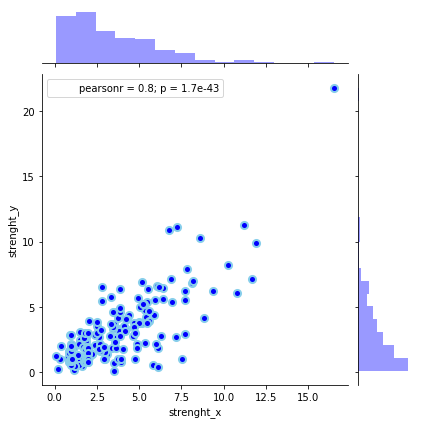

/anaconda3/envs/kflows/lib/python3.7/site-packages/seaborn/axisgrid.py:1847: UserWarning: JointGrid annotation is deprecated and will be removed in a future release.
  warnings.warn(UserWarning(msg))


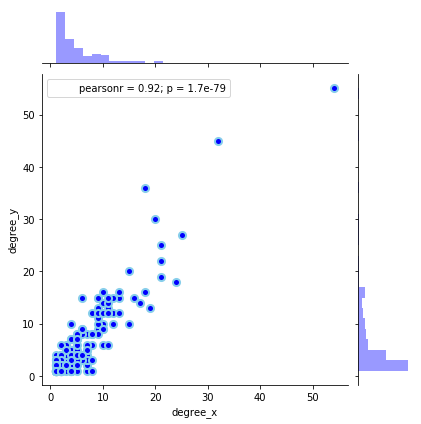

In [8]:
correlation_network_degree(Gm_simple_2009_2013,Gm_simple_2014_2018,'strength')
correlation_network_degree(Gm_simple_2009_2013,Gm_simple_2014_2018,'degree')


## Adjacency matrix:
### 2009-2013:

In [9]:
draw_adjacency_matrix(reduced_matrix_2009_2013,['StartIndst','FinalIndst'],'weight')

### 2014-2018:

In [10]:
draw_adjacency_matrix(reduced_matrix_2014_2018,['StartIndst','FinalIndst'],'weight')

/anaconda3/envs/kflows/lib/python3.7/site-packages/seaborn/axisgrid.py:1847: UserWarning: JointGrid annotation is deprecated and will be removed in a future release.
  warnings.warn(UserWarning(msg))


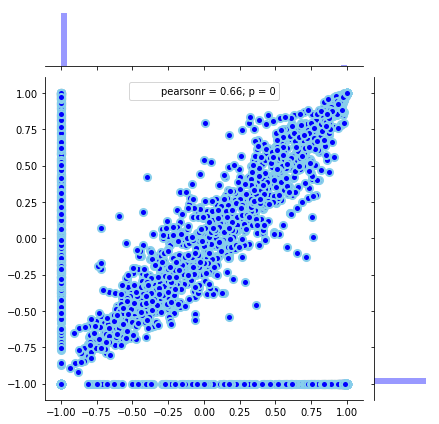

adjacency matrix correlation
(0.6646820310716097, 0.0)
percentage of the entries with non-symetrical missigness
0.9560185185185186


In [11]:
correlation_adjacency_matrix(reduced_matrix_2009_2013,reduced_matrix_2014_2018,'weight')

# Network visualisation: by main industry

im here
im here


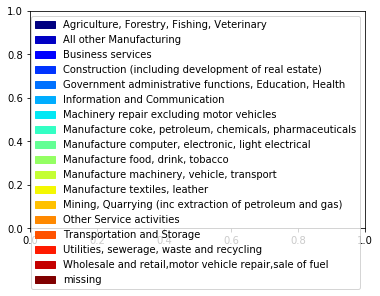

0

In [12]:
draw_network_by_classification(Gm_simple_2009_2013,'mainindustry','../img/'+label1+'/network_industry.png')

![title](../img/Table1_Reduced_matrix_2009_2013_flows/network_industry.png)


im here
im here


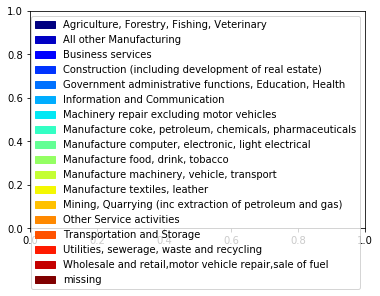

0

In [13]:
draw_network_by_classification(Gm_simple_2014_2018,'mainindustry','../img/'+label2+'/network_industry.png')

![title](../img/Table3_Reduced_matrix_2014_2018_flows/network_industry.png)


## Network visualisation: by community
## 2009 -2013:

In [14]:
network_components_2009_2013 = Gm_simple_2009_2013.components()
network_largest_2009_2013 = network_components_2009_2013.subgraphs()[0]


In [15]:
net_community_2009_2013 = network_largest_2009_2013.community_multilevel(weights=network_largest_2009_2013.es['weight'])
print ('Modularity',net_community_2009_2013.modularity)

Modularity 0.6772907076089962


In [16]:
list_2009_2013 = draw_and_print_communities(network_largest_2009_2013,net_community_2009_2013,'../img/'+label1+'/network_community.png')

Community : 1
['Child day-care' 'Dental practices' 'Educational support activities'
 'Elderly, disabled' 'Fire service activities' 'General medical practices'
 'General secondary' 'Hairdressing, beauty treatment'
 'Health care, education etc' 'Hospital activities'
 'Households as employers' 'Learning, mental, substance abuse'
 'Library and archive activities' 'Other' 'Other amusement, recreation'
 'Other education nec' 'Other nec' 'Performing arts'
 'Post-secondary non-tertiary' 'Pre-primary' 'Primary'
 'Religious organisations' 'Residential nursing care'
 'Specialist medical practices' 'Technical, vocational secondary'
 'Tertiary']

Community : 2
['Police, public order, safety activ.' 'Political organisations']

Community : 3
['Activities of call centres' 'Central heating radiators, boilers'
 'Data processing, hosting' 'Fund management activities'
 'Insurance agents/brokers activities' 'Life insurance'
 'Non-life insurance' 'Other credit granting' 'Other financial services'
 'Other fi

## 2014 - 2018:



In [17]:
network_components_2014_2018 = Gm_simple_2014_2018.components()
network_largest_2014_2018 = network_components_2014_2018.subgraphs()[0]
net_community_2014_2018 = network_largest_2014_2018.community_multilevel(weights=network_largest_2014_2018.es['weight'])

print ('Modularity',net_community_2014_2018.modularity)


Modularity 0.6523232852507371


In [18]:
list_2014_2018 = draw_and_print_communities(network_largest_2014_2018,net_community_2014_2018,'../img/'+label2+'/network_community.png')

Community : 1
['Accounting, auditing; tax consltcy' 'Beer' 'Beverages'
 'Bread, cakes, confectionery' 'Bread; pastry goods, cakes'
 'Chemical products' 'Condiments and seasonings' 'Defence activities'
 'Electric lighting equipment' 'Employment placement agencies'
 'Fish processing, preserving' 'Fruit and vegetables'
 'Grain mill products' 'Meat processing, preserving'
 'Meat, poultry meat production' 'Motor vehicle other parts'
 'Non-hazardous waste collection' 'Non-specialised wholesale trade'
 'Other' 'Other food products nec' 'Other fruit, vegetable'
 'Other intermediate products' 'Other natural sciences, engineering'
 'Other non-specialised' 'Other plastic' 'Other support activities'
 'Packaging activities' 'Pharmaceutical goods'
 'Pharmaceutical preparations' 'Plastic plates, sheets, tubes etc'
 'Poultry meat processing, preserving' 'Prepared meals and dishes'
 'Road freight transport' 'Rusks, biscuits; preserved pastry'
 'Social sciences, humanities' 'Soft drinks; waters'
 'Tempo

### 2009 - 2013:

!['something here'](../img/Table1_Reduced_matrix_2009_2013_flows/network_community.png)


### 2014 - 2018:


![title](../img/Table3_Reduced_matrix_2014_2018_flows/network_community.png)


In [19]:
compare_comunity_intersection(list_2009_2013,list_2014_2018,'2009 to 2013','2014 to 2018')

# 10 Year matrices (2009 - 2018)

In [20]:
label1 = "Table1_Reduced_matrix_2009_2018_flows"
reduced_matrix_2009_2018 = pd.read_csv("../data/"+label1+".csv", index_col=0)

reduced_matrix_2009_2018_flows = reduced_matrix_2009_2018[reduced_matrix_2009_2018['StartIndst']!=0]

sub_matrix_2009_2018_less1 = reduced_matrix_2009_2018_flows[reduced_matrix_2009_2018_flows['weight']<1].sort_values(by=['weight'], ascending=False)
sub_matrix_2009_2018_flows = sub_matrix_2009_2018_less1[sub_matrix_2009_2018_less1['weight']>0].sort_values(by=['weight'], ascending=False)

print ("Number of links:", sub_matrix_2009_2018_flows.shape[0]/2)
print ("Number of 4-digit industries observed:")
print (len(np.unique([sub_matrix_2009_2018_flows['StartIndst'].values,sub_matrix_2009_2018_flows['FinalIndst'].values])))
sub_matrix_2009_2018_flows[1:15]

Number of links: 287.0
Number of 4-digit industries observed:
170


,StartIndst,FinalIndst,weight,SubActivity_StartIndst,SubActivity_FinalIndst,MainActivity_StartIndst,MainActivity_FinalIndst,MainIndustry_StartIndst,MainIndustry_FinalIndst,Counts
1184,2363,2361,0.999442,Ready-mixed concrete,Concrete products for construction,"Concrete, cement and plaster","Concrete, cement and plaster",All other Manufacturing,All other Manufacturing,10.0
1132,2361,2363,0.999184,Concrete products for construction,Ready-mixed concrete,"Concrete, cement and plaster","Concrete, cement and plaster",All other Manufacturing,All other Manufacturing,41.0
1145,4634,1105,0.999042,Beverages,Beer,"Food, beverages, tobacco wholesale",Beverages,"Wholesale and retail,motor vehicle repair,sale...","Manufacture food, drink, tobacco",10.0
1196,4761,4763,0.999042,Books,"Music, video recordings",Specialised retail - other,Specialised retail - other,"Wholesale and retail,motor vehicle repair,sale...","Wholesale and retail,motor vehicle repair,sale...",61.0
1127,4671,1920,0.998951,"Fuels, related products",Refined petroleum products,Other wholesale,"Coke, refined petroleum","Wholesale and retail,motor vehicle repair,sale...","Manufacture coke, petroleum, chemicals, pharma...",10.0
1045,1105,4634,0.998684,Beer,Beverages,Beverages,"Food, beverages, tobacco wholesale","Manufacture food, drink, tobacco","Wholesale and retail,motor vehicle repair,sale...",53.0
1026,1920,4671,0.998543,Refined petroleum products,"Fuels, related products","Coke, refined petroleum",Other wholesale,"Manufacture coke, petroleum, chemicals, pharma...","Wholesale and retail,motor vehicle repair,sale...",59.0
1198,1013,1011,0.998518,"Meat, poultry meat production","Meat processing, preserving","Food products - meat, fish","Food products - meat, fish","Manufacture food, drink, tobacco","Manufacture food, drink, tobacco",43.0
1178,2829,2825,0.998226,Other,Non-domestic cooling/ventilation eq,General machinery,General machinery,"Manufacture machinery, vehicle, transport","Manufacture machinery, vehicle, transport",44.0
1095,1011,1013,0.997961,"Meat processing, preserving","Meat, poultry meat production","Food products - meat, fish","Food products - meat, fish","Manufacture food, drink, tobacco","Manufacture food, drink, tobacco",10.0


## Correlations of 10 year and 5 year matrices

### Count and degree correlations


/anaconda3/envs/kflows/lib/python3.7/site-packages/seaborn/axisgrid.py:1847: UserWarning: JointGrid annotation is deprecated and will be removed in a future release.
  warnings.warn(UserWarning(msg))


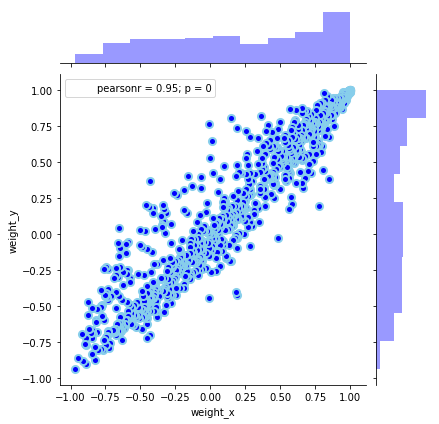

/anaconda3/envs/kflows/lib/python3.7/site-packages/seaborn/axisgrid.py:1847: UserWarning: JointGrid annotation is deprecated and will be removed in a future release.
  warnings.warn(UserWarning(msg))


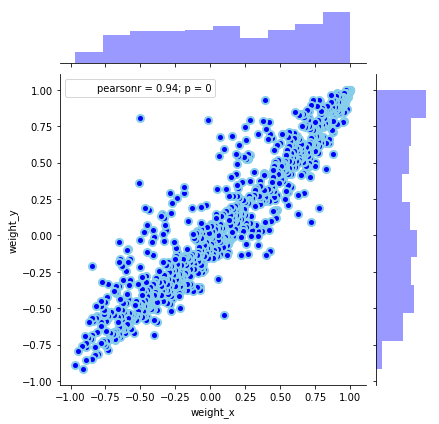

In [21]:
# 10 year vs 2008-2013
correlation_industry_pairs(sub_matrix_2009_2018_less1,sub_matrix_2009_2013_less1)

# 10 year vs 2014-2018

correlation_industry_pairs(sub_matrix_2009_2018_less1,sub_matrix_2014_2018_less1)


/anaconda3/envs/kflows/lib/python3.7/site-packages/seaborn/axisgrid.py:1847: UserWarning: JointGrid annotation is deprecated and will be removed in a future release.
  warnings.warn(UserWarning(msg))


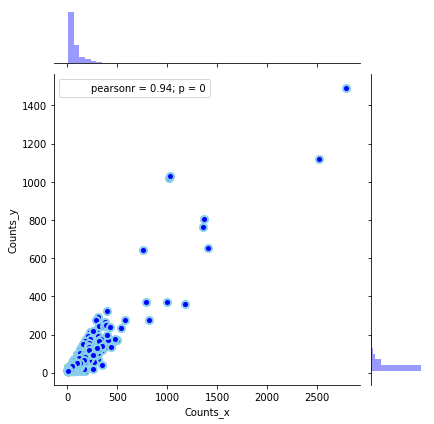

/anaconda3/envs/kflows/lib/python3.7/site-packages/seaborn/axisgrid.py:1847: UserWarning: JointGrid annotation is deprecated and will be removed in a future release.
  warnings.warn(UserWarning(msg))


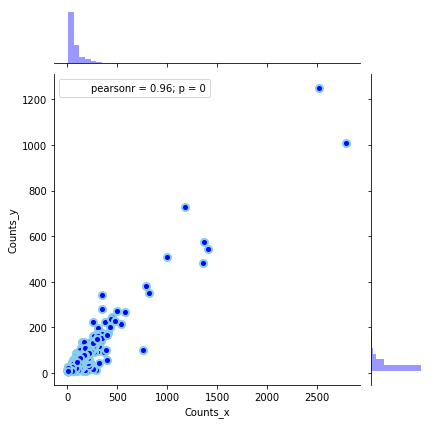

In [22]:
# 10 year vs 2008-2013
correlation_industry_pairs(sub_matrix_2009_2018_less1,sub_matrix_2009_2013_less1,'counts')

# 10 year vs 2014-2018

correlation_industry_pairs(sub_matrix_2009_2018_less1,sub_matrix_2014_2018_less1,'counts')

In [23]:
## Binned correlations

/Users/crangelsmith/PycharmProjects/KnowledgeFlows/python/labour_flows_matrix/src/correlations.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  df_industry1['id'] = df_industry1.groupby(['StartIndst', 'FinalIndst']).ngroup()
/anaconda3/envs/kflows/lib/python3.7/site-packages/seaborn/axisgrid.py:1847: UserWarning: JointGrid annotation is deprecated and will be removed in a future release.
  warnings.warn(UserWarning(msg))


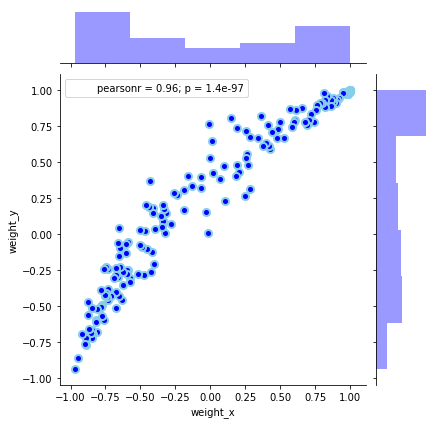

/anaconda3/envs/kflows/lib/python3.7/site-packages/seaborn/axisgrid.py:1847: UserWarning: JointGrid annotation is deprecated and will be removed in a future release.
  warnings.warn(UserWarning(msg))


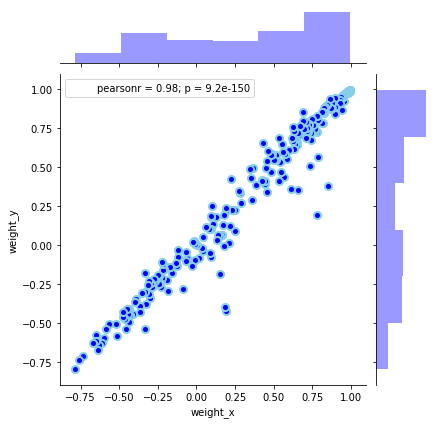

/anaconda3/envs/kflows/lib/python3.7/site-packages/seaborn/axisgrid.py:1847: UserWarning: JointGrid annotation is deprecated and will be removed in a future release.
  warnings.warn(UserWarning(msg))


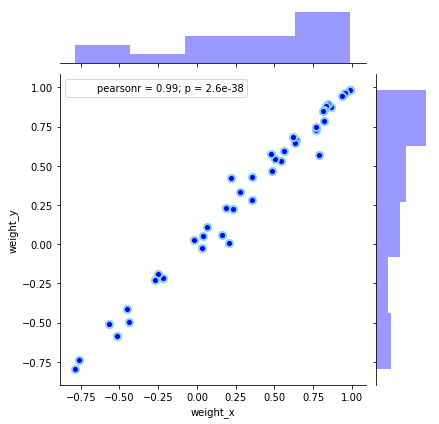

In [24]:
# 10 year vs 2008-2013


correlation_industry_pairs(sub_matrix_2009_2018_less1[sub_matrix_2009_2018_less1['Counts']<11],sub_matrix_2009_2013_less1,'weight')


correlation_industry_pairs(sub_matrix_2009_2018_less1[sub_matrix_2009_2018_less1['Counts']>100],sub_matrix_2009_2013_less1,'weight')

correlation_industry_pairs(sub_matrix_2009_2018_less1[sub_matrix_2009_2018_less1['Counts']>300],sub_matrix_2009_2013_less1,'weight')


/anaconda3/envs/kflows/lib/python3.7/site-packages/seaborn/axisgrid.py:1847: UserWarning: JointGrid annotation is deprecated and will be removed in a future release.
  warnings.warn(UserWarning(msg))


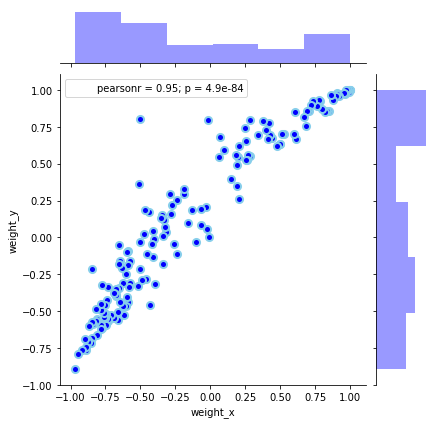

/anaconda3/envs/kflows/lib/python3.7/site-packages/seaborn/axisgrid.py:1847: UserWarning: JointGrid annotation is deprecated and will be removed in a future release.
  warnings.warn(UserWarning(msg))


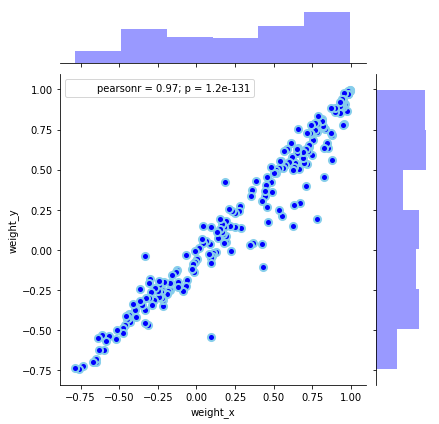

/anaconda3/envs/kflows/lib/python3.7/site-packages/seaborn/axisgrid.py:1847: UserWarning: JointGrid annotation is deprecated and will be removed in a future release.
  warnings.warn(UserWarning(msg))


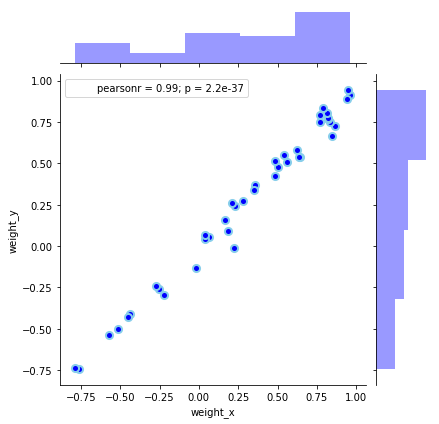

In [25]:
# 10 year vs 2014-2018

correlation_industry_pairs(sub_matrix_2009_2018_less1[sub_matrix_2009_2018_less1['Counts']<11],sub_matrix_2014_2018_less1,'weight')


correlation_industry_pairs(sub_matrix_2009_2018_less1[sub_matrix_2009_2018_less1['Counts']>100],sub_matrix_2014_2018_less1,'weight')

correlation_industry_pairs(sub_matrix_2009_2018_less1[sub_matrix_2009_2018_less1['Counts']>300],sub_matrix_2014_2018_less1,'weight')


In [28]:

Gm_simple_2009_2018_flows = build_network_object(reduced_matrix_2009_2018_flows,'weight')
network_components_2009_2018_flows = Gm_simple_2009_2018_flows.components()
network_largest_2009_2018_flows = network_components_2009_2018_flows.subgraphs()[0]
net_community_2009_2018_flows = network_largest_2009_2018_flows.community_multilevel(weights=network_largest_2009_2018_flows.es['weight'])
print ('Modularity',net_community_2009_2018_flows.modularity)

list_communities_flows = draw_and_print_communities(network_largest_2009_2018_flows,net_community_2009_2018_flows,'../img/'+label1+'/network_community.png')


Modularity 0.7184586710829003
Community : 1
['Agencies fee/contract basis' 'Child day-care' 'Dental practices'
 'Educational support activities' 'Elderly, disabled'
 'Fire service activities' 'Fitness facilities'
 'General medical practices' 'Health care, education etc'
 'Hospital activities' 'Households as employers'
 'Learning, mental, substance abuse' 'Managament of fee/contract basis'
 'Other' 'Pre-primary' 'Primary' 'Religious organisations'
 'Renting, operating own or leased ' 'Residential nursing care'
 'Specialist medical practices']

Community : 2
['Bread, cakes, confectionery' 'Bread; pastry goods, cakes'
 'Employment placement agencies' 'Manufacture of motor vehicles'
 'Meat processing, preserving' 'Meat, poultry meat production'
 'Motor vehicle coachwork,trailer' 'Motor vehicle other parts'
 'Non-specialised wholesale trade' 'Other food products nec'
 'Other fruit, vegetable' 'Other non-specialised' 'Other plastic'
 'Packaging activities' 'Poultry meat processing, preservin

In [29]:
compare_comunity_intersection(list_communities_flows,list_2009_2013,'2009 to 2018','2009 to 2013')

In [30]:
compare_comunity_intersection(list_communities_flows,list_2014_2018,'2009 to 2018','2014 to 2018')